# 기계학습 프로젝트
- 2018130469 정지윤

# I. 실험 내용 전체 요약
- 본 실험은 UCI Machine Learning Repository의 Adult dataset을 사용하여, native country를 제외한 13가지의 feature와 5가지 모델을 바탕으로 연봉이 5만 달러 이하인지 초과인지를 분류하였다.
- 사용한 모델은 Naive Bayes, Decision Tree, Linear Regression, MLP, 그리고 Random forest이다.
- 각 모델 적용 시에는 미리 dataset을 training set과 test set으로 나누어  1) original data로 training하고, 2) 5-fold cross validation과 stratified 5-fold cross validation을 수행한 후, 3) test set으로 모델의 성능을 테스트하였으며, 이 과정에서 모델의 parameter을 조절하고 배운 내용을 바탕으로 가능한 추가 analysis(e.g.decision tree plotting)도 함께 수행하였다.
- 또한 4) RFE를 사용한 feature selection을 통해 10개, 20개의 feature을 선택하였으며, 선택한 feature들로만 다시 해당 모델을 training / test한 성능을 1~3)의 과정을 통해 나온 성능과 비교하여 각 모델 내에서 최선의 성능을 내는 조건을 각각 찾았다.
- 마지막으로 이렇게 나온 모델별 최고 성능을 모두 비교하여, Adult dataset에서 연봉 5만 불 초과 여부를 classify하는 task를 가장 잘 수행하는 한 가지 모델을 선정하였다.

# II. 선정한 데이터 설명 및 URL
Adult dataset (UCI Machine Learning Repository) \\
- URL: \\
http://archive.ics.uci.edu/ml/datasets/Adult \\
http://archive.ics.uci.edu/ml/machine-learning-databases/adult/adult.data \\
- 설명: \\
미국인들의 나이, 직업, 성별 등 14가지 feature(attribute)과 '연봉이 5만 달러가 넘는지 여부'(output class)를 기록한 데이터이다.


## Dataset의 feature에 대한 자세한 설명 (참고)
###Prediction task
- to determine whether a person makes over 50K a year. \\

### Categories within a feature  
- age: continuous. \\
- workclass: Private, Self-emp-not-inc, Self-emp-inc, Federal-gov, Local-gov, State-gov, Without-pay, Never-worked. \\
- fnlwgt: continuous. / 일련의 관측 결과를 바탕으로 인구조사국이 부여하는 개인의 가중치입니다.\\
- education: Bachelors, Some-college, 11th, HS-grad, Prof-school, Assoc-acdm, Assoc-voc, 9th, 7th-8th, 12th, Masters, 1st-4th, 10th, Doctorate, 5th-6th, Preschool. \\
- education-num: continuous. \\
- marital-status: Married-civ-spouse, Divorced, Never-married, Separated, Widowed, Married-spouse-absent, Married-AF-spouse. \\
- occupation: Tech-support, Craft-repair, Other-service, Sales, Exec-managerial, Prof-specialty, Handlers-cleaners, Machine-op-inspct, Adm-clerical, Farming-fishing, Transport-moving, Priv-house-serv, Protective-serv, Armed-Forces. \\
- relationship: Wife, Own-child, Husband, Not-in-family, Other-relative, Unmarried. \\
- race: White, Asian-Pac-Islander, Amer-Indian-Eskimo, Other, Black. \\
- sex: Female, Male. \\
- capital-gain: continuous. \\
- capital-loss: continuous. \\
- hours-per-week: continuous. \\
- native-country: United-States, Cambodia, England, Puerto-Rico, Canada, Germany, Outlying-US(Guam-USVI-etc), India, Japan, Greece, South, China, Cuba, Iran, Honduras, Philippines, Italy, Poland, Jamaica, Vietnam, Mexico, Portugal, Ireland, France, Dominican-Republic, Laos, Ecuador, Taiwan, Haiti, Columbia, Hungary, Guatemala, Nicaragua, Scotland, Thailand, Yugoslavia, El-Salvador, Trinadad&Tobago, Peru, Hong, Holand-Netherlands.
  - 출처: http://archive.ics.uci.edu/ml/datasets/Adult



## Import data

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

df = pd.read_csv('http://archive.ics.uci.edu/ml/machine-learning-databases/adult/adult.data', delimiter=',')
df

,39,State-gov,77516,Bachelors,13,Never-married,Adm-clerical,Not-in-family,White,Male,2174,0,40,United-States,<=50K
0,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
1,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
2,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
3,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K
4,37,Private,284582,Masters,14,Married-civ-spouse,Exec-managerial,Wife,White,Female,0,0,40,United-States,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32555,27,Private,257302,Assoc-acdm,12,Married-civ-spouse,Tech-support,Wife,White,Female,0,0,38,United-States,<=50K
32556,40,Private,154374,HS-grad,9,Married-civ-spouse,Machine-op-inspct,Husband,White,Male,0,0,40,United-States,>50K
32557,58,Private,151910,HS-grad,9,Widowed,Adm-clerical,Unmarried,White,Female,0,0,40,United-States,<=50K
32558,22,Private,201490,HS-grad,9,Never-married,Adm-clerical,Own-child,White,Male,0,0,20,United-States,<=50K


## Preprocess & Split Data

### Data Preprocessing
1. 데이터셋에 column(feature) names를 추가한다.
2. 2가지 값만 가지는 column(sex, income)의 데이터를 정수형으로 변환한다.
3. object dtype을 가지는 column들을 one-hot encoding한다.

- sklearn을 사용한 기계학습에서는 string으로 표현된 모든 categorical data를 LabelEncoder이나 One-hot Encoder을 사용하여 정수형으로 바꾸어 주어야 한다.
  - output class나 2가지 값만 가지는 feature은 LabelEncoder을, 그 외에는 One-hot Encoder을 사용하여야 한다.
  - 3가지 이상의 값을 가지는 feature에 labelEncoder을 사용하면, 변환된 int값을 수치값으로 인식하여 decision tree를 형성할 때 대소관계를 비교하는 등 categorical data에서 할 수 없는 연산들이 이루어지기 때문에, feature의 개수가 많아지더라도 제대로 된 분석을 위해 One-hot encoding을 하여야 한다.
- 이러한 이유 때문에 category의 가짓수가 너무 많은 native_country는 drop하였다.  
  - (다른 feature들은 category가 아무리 많아도 10개 전후인데, native_country는 category가 30개가 넘는다.)
- 또한, feature 중 education은 education_num의 정보로 대체 가능하므로 drop하였다.



In [ ]:
#1. add column names to dataset
df.columns = ['age', 'workclass', 'fnlwgt', 'education', 'education_num', 'marital_status', 'occupation', 'relationship', 'race', 'sex', 'capital_gain', 'capital_loss', 'hours_per_week', 'native_country', 'income']
df.head()

,age,workclass,fnlwgt,education,education_num,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country,income
0,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,Male,0,0,13,United-States,<=50K
1,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,Male,0,0,40,United-States,<=50K
2,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,Male,0,0,40,United-States,<=50K
3,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,Female,0,0,40,Cuba,<=50K
4,37,Private,284582,Masters,14,Married-civ-spouse,Exec-managerial,Wife,White,Female,0,0,40,United-States,<=50K


In [ ]:
df.describe()

,age,fnlwgt,education_num,capital_gain,capital_loss,hours_per_week
count,32560.000000,3.256000e+04,32560.000000,32560.000000,32560.000000,32560.000000
mean,38.581634,1.897818e+05,10.080590,1077.615172,87.306511,40.437469
std,13.640642,1.055498e+05,2.572709,7385.402999,402.966116,12.347618
min,17.000000,1.228500e+04,1.000000,0.000000,0.000000,1.000000
25%,28.000000,1.178315e+05,9.000000,0.000000,0.000000,40.000000
50%,37.000000,1.783630e+05,10.000000,0.000000,0.000000,40.000000
75%,48.000000,2.370545e+05,12.000000,0.000000,0.000000,45.000000
max,90.000000,1.484705e+06,16.000000,99999.000000,4356.000000,99.000000


In [ ]:
df['native_country'].value_counts().sort_index

<bound method Series.sort_index of  United-States                 29169
 Mexico                          643
 ?                               583
 Philippines                     198
 Germany                         137
 Canada                          121
 Puerto-Rico                     114
 El-Salvador                     106
 India                           100
 Cuba                             95
 England                          90
 Jamaica                          81
 South                            80
 China                            75
 Italy                            73
 Dominican-Republic               70
 Vietnam                          67
 Guatemala                        64
 Japan                            62
 Poland                           60
 Columbia                         59
 Taiwan                           51
 Haiti                            44
 Iran                             43
 Portugal                         37
 Nicaragua                        34
 Pe

In [ ]:
#2. change string labels in 'sex' feature and 'income' with integer label
# using scikit-learn 's  LabelEncoder
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
df.sex = le.fit_transform(df.sex) # Female = 0,  Male = 1
df.income = le.fit_transform(df.income) # <=50K = 0, >50K = 1
df.head()

,age,workclass,fnlwgt,education,education_num,marital_status,occupation,relationship,race,sex,capital_gain,capital_loss,hours_per_week,native_country,income
0,50,Self-emp-not-inc,83311,Bachelors,13,Married-civ-spouse,Exec-managerial,Husband,White,1,0,0,13,United-States,0
1,38,Private,215646,HS-grad,9,Divorced,Handlers-cleaners,Not-in-family,White,1,0,0,40,United-States,0
2,53,Private,234721,11th,7,Married-civ-spouse,Handlers-cleaners,Husband,Black,1,0,0,40,United-States,0
3,28,Private,338409,Bachelors,13,Married-civ-spouse,Prof-specialty,Wife,Black,0,0,0,40,Cuba,0
4,37,Private,284582,Masters,14,Married-civ-spouse,Exec-managerial,Wife,White,0,0,0,40,United-States,0


In [ ]:
df.dtypes

age                int64
workclass         object
fnlwgt             int64
education         object
education_num      int64
marital_status    object
occupation        object
relationship      object
race              object
sex                int64
capital_gain       int64
capital_loss       int64
hours_per_week     int64
native_country    object
income             int64
dtype: object

In [ ]:
# drop columns(features) with too many categories
# one hot encoding 전에 행/열 drop

# na 값을 포함한 행을 drop함.
df = df.dropna()

# education의 정보는 education_num으로 알 수 있으므로 drop함.
df = df.drop(['education'], axis=1)

# category 가짓수가 너무 많은 native_country도 drop함.
df = df.drop(['native_country'], axis=1)

In [ ]:
# onehot() 함수를 사용하여 dtype이 object인 feature들을 one-hot encoding 해줌.

#onehot()함수 출처: 실습과제 3장
def onehot(data, feature):
  '''
  data의 feature column을 one hot으로 변환해줍니다.
  data: pandas DataFrame
  feature: string, 데이터 프레임의 column 이름
  '''
  return pd.concat([data, pd.get_dummies(data[feature], prefix=feature)], axis=1).drop([feature], axis=1)

In [ ]:
df_oh = onehot(df, 'workclass')
df_oh = onehot(df_oh, 'marital_status')
df_oh = onehot(df_oh, 'occupation')
df_oh = onehot(df_oh, 'relationship')
df_oh = onehot(df_oh, 'race')

df_oh.head()

,age,fnlwgt,education_num,sex,capital_gain,capital_loss,hours_per_week,income,workclass_ ?,workclass_ Federal-gov,workclass_ Local-gov,workclass_ Never-worked,workclass_ Private,workclass_ Self-emp-inc,workclass_ Self-emp-not-inc,workclass_ State-gov,workclass_ Without-pay,marital_status_ Divorced,marital_status_ Married-AF-spouse,marital_status_ Married-civ-spouse,marital_status_ Married-spouse-absent,marital_status_ Never-married,marital_status_ Separated,marital_status_ Widowed,occupation_ ?,occupation_ Adm-clerical,occupation_ Armed-Forces,occupation_ Craft-repair,occupation_ Exec-managerial,occupation_ Farming-fishing,occupation_ Handlers-cleaners,occupation_ Machine-op-inspct,occupation_ Other-service,occupation_ Priv-house-serv,occupation_ Prof-specialty,occupation_ Protective-serv,occupation_ Sales,occupation_ Tech-support,occupation_ Transport-moving,relationship_ Husband,relationship_ Not-in-family,relationship_ Other-relative,relationship_ Own-child,relationship_ Unmarried,relationship_ Wife,race_ Amer-Indian-Eskimo,race_ Asian-Pac-Islander,race_ Black,race_ Other,race_ White
0,50,83311,13,1,0,0,13,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1
1,38,215646,9,1,0,0,40,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1
2,53,234721,7,1,0,0,40,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0
3,28,338409,13,0,0,0,40,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0
4,37,284582,14,0,0,0,40,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1


### Split data
1. dataset을 x(14가지 feature)와 y(income = output class)로 분리
2. x(input data)를 train-set과 test-set으로 구분하기
3. (cross validation - 각 모델에서 실제 training시 사용)

In [ ]:
#1. split data into x(containing 14 features) and y(inocme = output class)
y = df_oh[['income']]
x = df_oh.drop(['income'], axis=1)

x.head()

,age,fnlwgt,education_num,sex,capital_gain,capital_loss,hours_per_week,workclass_ ?,workclass_ Federal-gov,workclass_ Local-gov,workclass_ Never-worked,workclass_ Private,workclass_ Self-emp-inc,workclass_ Self-emp-not-inc,workclass_ State-gov,workclass_ Without-pay,marital_status_ Divorced,marital_status_ Married-AF-spouse,marital_status_ Married-civ-spouse,marital_status_ Married-spouse-absent,marital_status_ Never-married,marital_status_ Separated,marital_status_ Widowed,occupation_ ?,occupation_ Adm-clerical,occupation_ Armed-Forces,occupation_ Craft-repair,occupation_ Exec-managerial,occupation_ Farming-fishing,occupation_ Handlers-cleaners,occupation_ Machine-op-inspct,occupation_ Other-service,occupation_ Priv-house-serv,occupation_ Prof-specialty,occupation_ Protective-serv,occupation_ Sales,occupation_ Tech-support,occupation_ Transport-moving,relationship_ Husband,relationship_ Not-in-family,relationship_ Other-relative,relationship_ Own-child,relationship_ Unmarried,relationship_ Wife,race_ Amer-Indian-Eskimo,race_ Asian-Pac-Islander,race_ Black,race_ Other,race_ White
0,50,83311,13,1,0,0,13,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1
1,38,215646,9,1,0,0,40,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1
2,53,234721,7,1,0,0,40,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0
3,28,338409,13,0,0,0,40,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0
4,37,284582,14,0,0,0,40,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1


In [ ]:
y.head()

,income
0,0
1,0
2,0
3,0
4,0


In [ ]:
#2. Split x(input data) into train-set and test-set
from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=42, shuffle=True)

#III. 실험 설계 및 방법

##1. Naive Bayesian Classifier
- 선정 이유: 가장 기본적인 분류기 중 하나로 다른 classifier의 성능을 가늠하는데 유용할 것이라고 생각하여 선정하였다. 또한 현재 전처리된 dataset에서는 one-hot encoding된 것을 포함하여 feature이 총 49개로 매우 많고 따라서 feature space도 복잡할 수밖에 없다. 그래서 feature space의 변형을 통해 classification을 수행하는 모델들 이전에 확률로 classification을 수행하는 Naive Bayesian classifier을 먼저 선택하였다.

### Training (Original data)

In [ ]:
from sklearn.naive_bayes import CategoricalNB

# 모델 생성
model_NB = CategoricalNB()

# 데이터에 모델 훈련
model_NB.fit(x_train, y_train.values.ravel())

CategoricalNB()

### Cross validation

In [ ]:
# cross validation with training set
#(CV score, cv=5)
from sklearn.model_selection import cross_val_score

model_NB_cv = CategoricalNB()
scores_NB_cv = cross_val_score(model_NB_cv, x_train, y_train.values.ravel(), cv=5)
print(scores_NB_cv)
scores_NB_cv = np.delete(scores_NB_cv, 3)# np.argwhere(scores_NB_cv == nan인 경우 제외))
print(scores_NB_cv.mean())

/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py:775: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_validation.py", line 762, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_scorer.py", line 105, in __call__
    score = scorer(estimator, *args, **kwargs)
  File "/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_scorer.py", line 418, in _passthrough_scorer
    return estimator.score(*args, **kwargs)
  File "/usr/local/lib/python3.7/dist-packages/sklearn/base.py", line 646, in score
    return accuracy_score(y, self.predict(X), sample_weight=sample_weight)
  File "/usr/local/lib/python3.7/dist-packages/sklearn/naive_bayes.py", line 83, in predict
    jll = self._joint_log_likelihood(X)
  File "/usr/local/

[0.82715508 0.83899978 0.82865292        nan 0.83260202]
0.8318524487243022


In [ ]:
# Stratified KFold (K=5)
from sklearn.model_selection import StratifiedKFold

scores_NB = np.array([])

val_accuracy_NB = np.array([])

skf_NB = StratifiedKFold(n_splits=5) #KFold대신 StratifiedKFold 사용

for train_index, val_index in skf_DT.split(x_train, y_train): #3-2-1. training 데이터셋을 train, validation으로 나눔
  X_train_cv, X_val_cv = x_train.iloc[train_index], x_train.iloc[val_index]
  y_train_cv, y_val_cv = y_train.iloc[train_index], y_train.iloc[val_index]
  skf_NB_cv = DecisionTreeClassifier(max_leaf_nodes=5000) #3-2-2. 각 폴드에 대해 k 값으로 KNeighborsClassifier(n_neighbors=k) 모델을 생성
  skf_NB_cv.fit(X_train_cv, y_train_cv.values.ravel()) #3-2-3. 각 폴드에 대해 나뉘어진 train, validation에 대하여 모델을 fit하기.
  skf_NB_cv_score = skf_NB_cv.score(X_val_cv, y_val_cv)
  val_accuracy_NB = np.append(val_accuracy_NB, skf_NB_cv_score) #3-2-4. 각 폴드에 대해 KNN classifier의 정확도를 과제 1과 동일한 방식으로 저장
  scores_NB = np.append(scores_NB, val_accuracy_NB.mean()) #3-2-5. val_accuracy의 평균을 score 리스트에 append하기.

print(scores_NB) #3-3. score 리스트를 프린트하기
print(scores_NB.mean()) #val_accuracy의 평균을 구하여 출력

[0.81223953 0.81289757 0.81354207 0.81205431 0.81094226]
0.812335146557977


### Test (Score)

In [ ]:
# 모델의 정확도
score_NB = model_NB.score(x_test, y_test)
score_NB

0.825962325962326

#### Class probability (Additional analysis for Naive Bayes)

In [ ]:
#class의 probability 출력

class_log_prior = model_NB.class_log_prior_
class_prior = np.exp(class_log_prior)
class_prior

array([0.76009126, 0.23990874])

In [ ]:
# 각 feature의 category와 class의 probability 출력
# (feature과 feature 안의 category의 수가 너무 많으므로, 결과 분석에는 사용하지 않았음)

feature_log_prior = model_NB.feature_log_prob_
for feature_prior in feature_log_prior:
  print(np.exp(feature_prior))

[[5.74217628e-05 5.74217628e-05 5.74217628e-05 5.74217628e-05
  5.74217628e-05 5.74217628e-05 5.74217628e-05 5.74217628e-05
  5.74217628e-05 5.74217628e-05 5.74217628e-05 5.74217628e-05
  5.74217628e-05 5.74217628e-05 5.74217628e-05 5.74217628e-05
  5.74217628e-05 1.67097330e-02 2.31983922e-02 2.78495550e-02
  3.16968131e-02 2.86534597e-02 2.92276773e-02 3.54292277e-02
  3.15245478e-02 3.25581395e-02 2.96296296e-02 3.05483778e-02
  3.06057996e-02 2.72753374e-02 2.81940856e-02 2.77347115e-02
  2.48636233e-02 2.85386161e-02 2.53804192e-02 2.64714327e-02
  2.55526845e-02 2.24519093e-02 2.13034740e-02 2.24519093e-02
  2.04995693e-02 2.13034740e-02 1.95808211e-02 1.96956647e-02
  1.76859030e-02 1.82026988e-02 1.70542636e-02 1.60206718e-02
  1.32070055e-02 1.52741889e-02 1.32070055e-02 1.45277060e-02
  1.15417743e-02 1.12546655e-02 9.13006029e-03 1.09675567e-02
  1.02784955e-02 9.70427792e-03 1.01062303e-02 9.47459087e-03
  8.49842090e-03 8.15389032e-03 7.98162504e-03 7.23514212e-03
  6.0867

### Parameter 조정

In [ ]:
#1. alpha값 조정 (Additive (Laplace/Lidstone) smoothing parameter (0 for no smoothing))

from sklearn.naive_bayes import CategoricalNB

# 모델 생성
model_NB_a = CategoricalNB(alpha=2.5) #default: 1.0

# 데이터에 모델 훈련
model_NB_a.fit(x_train, y_train.values.ravel())

# 모델의 정확도
score_NB_a = model_NB_a.score(x_test, y_test)
score_NB_a

0.829033579033579

In [ ]:
#2. min categories 조정 (Minimum number of categories per feature)
from sklearn.naive_bayes import CategoricalNB

# 모델 생성
model_NB_mc = CategoricalNB(min_categories=20) #default: None

# 데이터에 모델 훈련
model_NB_mc.fit(x_train, y_train.values.ravel())

# 모델의 정확도
score_NB_mc = model_NB_mc.score(x_test, y_test)
score_NB_mc

0.8291359541359541

### Feature Selection
- 실습에서 배운 feature selection 방법 중 성능이 가장 좋았던, RandomForestClassifier을 사용한 RFE(Recurrent Feature Elimination) 방법 사용


#### 1) Feature을 10개 선택

In [ ]:
from sklearn.feature_selection import RFE
from sklearn.ensemble import RandomForestClassifier

# RFE 생성, 데이터에 훈련시킴.
select = RFE(RandomForestClassifier(n_estimators=100, random_state=42), n_features_to_select=10)
select.fit(x_train, y_train.values.ravel())

RFE(estimator=RandomForestClassifier(random_state=42), n_features_to_select=10)

Text(0.5, 0, 'feature number')

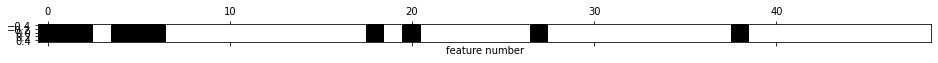

In [ ]:
# 선택된 특성 시각화
mask = select.get_support()
plt.matshow(mask.reshape(1, -1), cmap='gray_r')
plt.xlabel("feature number")

In [ ]:
# RFE를 사용해서 특성을 선택했을 때 CategoricalNB의 정확도 확인

from sklearn.naive_bayes import CategoricalNB

X_train_rfe = select.transform(x_train)
X_test_rfe = select.transform(x_test)

score = CategoricalNB().fit(X_train_rfe, y_train.values.ravel()).score(X_test_rfe, y_test)
print("test score", score)

test score 0.8485872235872236


In [ ]:
# RFE에 사용된 모델을 이용해 예측. (이 경우 선택된 특성만 사용됨
score_sel = select.score(x_test, y_test)
score_sel

0.8468468468468469

#### 2) Feature을 20개 선택
* (Decision tree에서 만들어 실행해 본 후에 다시 Naive Bayes에 적용하였기 때문에, RFE 모델을 생성하는 코드는 Decision Tree 부분에 있음.)

In [ ]:
# RFE를 사용해서 특성을 선택했을 때 CategoricalNB의 정확도를 확인해보겠습니다.

score = CategoricalNB().fit(X_train_rfe_DT, y_train.values.ravel()).score(X_test_rfe_DT, y_test)
print("test score", score)

test score 0.8382473382473382


In [ ]:
# 또한 RFE에 사용된 모델을 이용해서도 예측을 할 수 있습니다. 이 경우 선택된 특성만 사용됩니다.
score_sel_DT = select_DT.score(x_test, y_test)
score_sel_DT

0.8533988533988534

#### Analysis

* Naive Bayes 모델(CategoricalNB)을 사용했을 때, Feature selection 후 약 0.02만큼 정확도가 향상되었다.

* Prior class probability를 통해 'income' column의 값이 0인 경우가 약 76%, 1인 경우가 약 24%임을 알 수 있다.
  * 즉 이 데이터에서 연 소득이 5만불 이하인 사람이 76%, 5만불 초과인 사람이 24%라는 뜻이다.
  * Zero-R 모델을 적용하여 'income' class를 무조건 0으로만 예측해도 약 0.76의 정확도가 나온다는 뜻이므로, 이 보고서에서 적용한 모델들의 정확도가 최소한 0.77 이상이어야 classifier을 사용한 의미가 있다고 할 수 있다.
  * (각 feature의 category와 class의 probability를 출력한 것은, feature과 feature 안의 category의 수가 너무 많아 분석하지 않았다.) \\

* Parameter을 조정했을 경우, alpha값을 높였을 때와 min categories 수를 20으로 설정하였을 때, parameter을 조정하지 않은 모델(기본 모델)보다 각각 약 0.03정도 성능이 향상되었다.

* Feature selection(10개) 이후 plot된 feature을 보면, select 된 대부분의 feature이 원래 categorical이 아닌 integer data임을 알 수 있다.
  * 앞의 데이터 순서와 맞춰봤을 때, age, fnlwgt, education_num,	capital_gain, capital_loss, hours_per_week의 6가지 numerical feature이 모두 선택되었음을 알 수 있다.(그 외에는 모두 label encoding이나 one-hot encoding된 categorical feature들이다.)
  * feature을 20개를 선택했을 때에는 10개만 선택했을 때보다 약 0.01만큼 성능이 감소하였다. 이를 통해 선택하는 Feature의 개수를 늘린다고 해서 Naive Bayes classifier의 성능이 좋아지는 것은 아님을 유추할 수 있다.
  * RFE 모델의 성능 자체는 feature을 20개 선택한 경우에 10개만 선택한 경우보다 약 0.01만큼 증가하였다. 이를 통해 선택된 feature의 수가 많아지고 feature selection이 효과적으로 이루어졌다고 해도, 평가 시 적용되는 모델에 따라 성능이 향상되는지의  여부가 다르다는 것을 알 수 있다.
* 결론적으로, Naive Bayes 모델을 사용할 경우에는 feature selection을 하지 않은 채로 min categories 수를 조정했을 때 가장 좋은 결과를 얻었다. (약 0.829)




##2. Decision Tree
- 선정 이유: 배운 모델 중 조정할 수 있는 parameter이 가장 다양하기 때문에 decision tree라는 모델 자체 뿐 아니라 각 parameter이 성능에 미치는 영향을 관찰할 수 있기 때문에 선정하였다. 또한 tree 형성 후 score 수치뿐 아니라 시각화를 통해 impurity decrease에 크게 기여하는 feature들을 쉽게 알아볼 수 있다는 장점도 있다.

### Training (Original data)

In [ ]:
from sklearn.tree import DecisionTreeClassifier
# classifier 결정트리를 시각화
from sklearn.tree import export_graphviz # drawing graphs specified in DOT language scripts
#from sklearn.externals.six import StringIO
from six import StringIO
from IPython.display import Image
import pydotplus

#2) 결정트리 모델 생성
model_DT = DecisionTreeClassifier(max_leaf_nodes=5000)
model_DT.fit(x_train, y_train)

#### Cross Validation

In [ ]:
# CV score (cv=5)
from sklearn.model_selection import cross_val_score

model_DT_cv = DecisionTreeClassifier(max_leaf_nodes=5000)
scores_DT_cv = cross_val_score(model_DT_cv, x_train, y_train.values.ravel(), cv=5)
print(scores_DT_cv)
print(scores_DT_cv.mean())

[0.80894933 0.81816188 0.81197894 0.81044318 0.81132075]
0.8121708156556122


In [ ]:
# Stratified KFold (K=5)
from sklearn.model_selection import StratifiedKFold

scores_DT = np.array([])

val_accuracy_DT = np.array([])

skf_DT = StratifiedKFold(n_splits=5) #KFold대신 StratifiedKFold 사용

for train_index, val_index in skf_DT.split(x_train, y_train): #3-2-1. training 데이터셋을 train, validation으로 나눔
  X_train_cv, X_val_cv = x_train.iloc[train_index], x_train.iloc[val_index]
  y_train_cv, y_val_cv = y_train.iloc[train_index], y_train.iloc[val_index]
  skf_DT_cv = DecisionTreeClassifier(max_leaf_nodes=5000) #3-2-2. 각 폴드에 대해 k 값으로 KNeighborsClassifier(n_neighbors=k) 모델을 생성
  skf_DT_cv.fit(X_train_cv, y_train_cv.values.ravel()) #3-2-3. 각 폴드에 대해 나뉘어진 train, validation에 대하여 모델을 fit하기.
  skf_DT_cv_score = skf_DT_cv.score(X_val_cv, y_val_cv)
  val_accuracy_DT = np.append(val_accuracy_DT, skf_DT_cv_score) #3-2-4. 각 폴드에 대해 KNN classifier의 정확도를 과제 1과 동일한 방식으로 저장
  scores_DT = np.append(scores_DT, val_accuracy_DT.mean()) #3-2-5. val_accuracy의 평균을 score 리스트에 append하기.

print(scores_DT) #3-3. score 리스트를 프린트하기
print(scores_DT.mean()) #val_accuracy의 평균을 구하여 출력

[0.81202018 0.81388462 0.81259121 0.8103539  0.81076666]
0.8119233147265904


### Test (Score)

In [ ]:
#3) 테스트셋 분류 정확도 확인
print(model_DT.score(x_test, y_test))

#4) 결정트리 모델 시각화
dot_data = StringIO()
export_graphviz(model_DT, feature_names=x_train.columns, out_file=dot_data)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('/tree.png')
Image(graph.create_png())

0.8126535626535627
dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.254382 to fit

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.254382 to fit



### Parameter 조정

0.8457207207207207


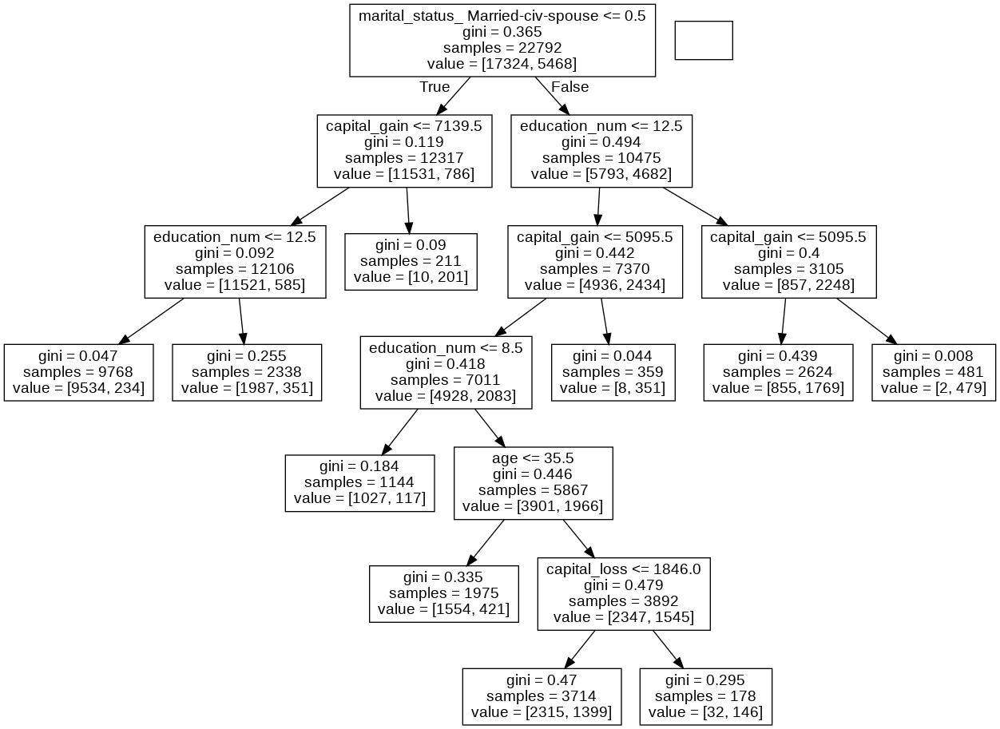

In [ ]:
#1. max leaf nodes
prune_classifier_mln = DecisionTreeClassifier(max_leaf_nodes=10)
prune_classifier_mln.fit(x_train, y_train)
print(prune_classifier_mln.score(x_test, y_test))

#결정트리 모델 시각화
dot_data = StringIO()
export_graphviz(prune_classifier_mln, feature_names=x_train.columns, out_file=dot_data)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('/tree.png')
Image(graph.create_png())

0.844082719082719


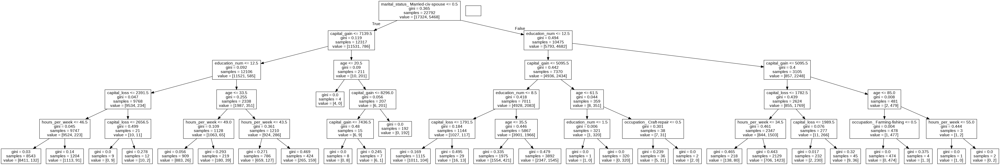

In [ ]:
#2. max depth
prune_classifier_md = DecisionTreeClassifier(max_depth=5)
prune_classifier_md.fit(x_train, y_train)
print(prune_classifier_md.score(x_test, y_test))

#결정트리 모델 시각화
dot_data = StringIO()
export_graphviz(prune_classifier_md, feature_names=x_train.columns, out_file=dot_data)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('/tree.png')
Image(graph.create_png())

In [ ]:
#3. min samples split
prune_classifier_mss = DecisionTreeClassifier(min_samples_split=100)
prune_classifier_mss.fit(x_train, y_train)
print(prune_classifier_mss.score(x_test, y_test))

#결정트리 모델 시각화
dot_data = StringIO()
export_graphviz(prune_classifier_mss, feature_names=x_train.columns, out_file=dot_data)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('/tree.png')
Image(graph.create_png())

0.8524774774774775


0.8516584766584766


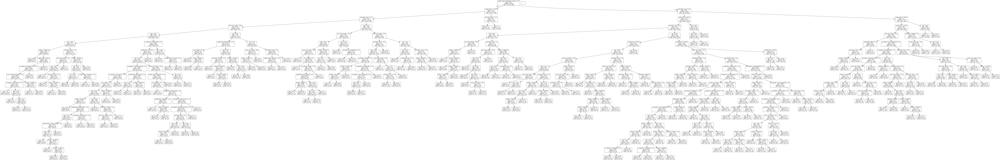

In [ ]:
#4. min samples leaf
prune_classifier_msl = DecisionTreeClassifier(min_samples_leaf=50)
prune_classifier_msl.fit(x_train, y_train)
print(prune_classifier_msl.score(x_test, y_test))

#결정트리 모델 시각화
dot_data = StringIO()
export_graphviz(prune_classifier_msl, feature_names=x_train.columns, out_file=dot_data)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('/tree.png')
Image(graph.create_png())

0.8419328419328419


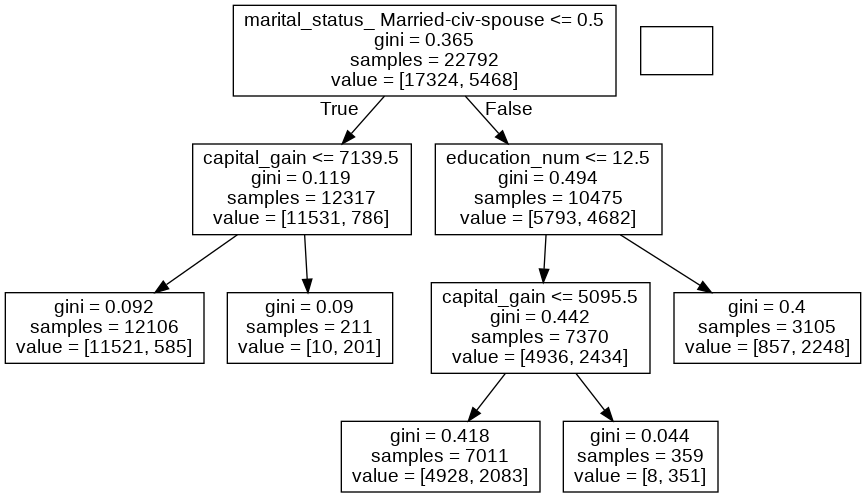

In [ ]:
#5. min impurity decrease
prune_classifier_mid = DecisionTreeClassifier(min_impurity_decrease=0.01)
prune_classifier_mid.fit(x_train, y_train)
print(prune_classifier_mid.score(x_test, y_test))

#결정트리 모델 시각화
dot_data = StringIO()
export_graphviz(prune_classifier_mid, feature_names=x_train.columns, out_file=dot_data)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
graph.write_png('/tree.png')
Image(graph.create_png())

### Feature Selection


####1) Feature을 10개 선택
(1번 Naive Bayes의 Feature selection에서 만든 X_train_rfe 사용)

In [ ]:
# RFE를 사용해서 특성을 선택했을 때 DecisionTreeClassifier의 정확도를 확인해보겠습니다.

score = DecisionTreeClassifier().fit(X_train_rfe, y_train.values.ravel()).score(X_test_rfe, y_test)
print("test score", score)

test score 0.8116298116298116


#### 2) Feature을 20개 선택
- feature 10개가 decision tree에서 split을 할 때 사용하기에 너무 적은 수가 아닌가 생각하여, feature을 20개까지 select하였다.
- 또한 1)에서 선택된 10개의 feature이 대부분 numerical feature들이어서, categorical feature도 함께 선택되었을 때 어떤 결과가 나오는지 알아보고자 하였다.

In [ ]:
from sklearn.feature_selection import RFE
from sklearn.ensemble import RandomForestClassifier

# RFE 생성, 데이터에 훈련시킴.
select_DT = RFE(RandomForestClassifier(n_estimators=100, random_state=42), n_features_to_select=20)
select_DT.fit(x_train, y_train.values.ravel())

RFE(estimator=RandomForestClassifier(random_state=42), n_features_to_select=20)

Text(0.5, 0, 'feature number')

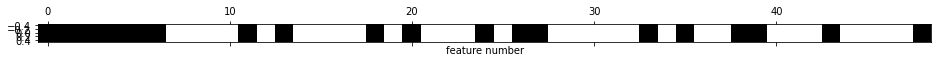

In [ ]:
# 선택된 특성 시각화
mask_DT = select_DT.get_support()
plt.matshow(mask_DT.reshape(1, -1), cmap='gray_r')
plt.xlabel("feature number")

In [ ]:
# RFE를 사용해서 특성을 선택했을 때 Decision tree의 정확도 확인.

from sklearn.tree import DecisionTreeClassifier

X_train_rfe_DT = select_DT.transform(x_train)
X_test_rfe_DT = select_DT.transform(x_test)

score = DecisionTreeClassifier().fit(X_train_rfe_DT, y_train.values.ravel()).score(X_test_rfe_DT, y_test)
print("test score", score)

test score 0.8111179361179361


In [ ]:
# 또한 RFE에 사용된 모델을 이용해서도 예측을 할 수 있습니다. 이 경우 선택된 특성만 사용됩니다.
score_sel_DT = select_DT.score(x_test, y_test)
score_sel_DT

0.8533988533988534

### Analysis
* parameter을 조정하지 않아 pruning이 전혀 되지 않은 tree의 성능은 약 0.812로, Naive Bayesian에 비해서 약간 낮았다(약 0.01).
  * input feature이 많았기 때문에 plotting해도 어떤 feature이 먼저 사용되었는지 알아볼 수 없을 만큼 많은 가지가 발생하였다. Training data에 Overfitting 되었을 가능성이 있다.
  * 따라서 decision tree의 장점을 살려 classification을 하려면 parameter의 조정을 통한 pruning이 필수적인 것으로 보인다.
* Parameter 조정 후 정확도가 0.03~0.04 만큼 상승하였다. \\
  * 원래 one-hot encoding된 variable의 수가 많아 조정하지 않은 tree는 가지의 수가 지나치게 많아 feature space가 복잡했고 overfitting이 될 수 밖에 없었다. \\
  * 그러나 원래 트리에서 leaf node의 수, leaf에 포함된 sample의 수, tree의 depth, split 할 때 sample 수나 impurity 감소 정도에 조건을 부여하면서 pruning(가지치기)이 일어나, relevant한 feature을 우선적으로 사용하고 overfitting을 줄여 성능이 높아진 것으로 보인다.
* 총 40여개의 feature 중 10개를 선택했을 때에는 feature selection 후 일반 Test 때와 비슷하지만 약간 성능이 감소하였고(약 0.001), 20개를 선택했을 때에는 더 크게 성능이 감소하였다(약 0.01).
  * feature selection을 20개도 해 본 이유는 feature 10개가 decision tree에서 split을 하기에 너무 적은 수가 아닌가 생각이 들었기 때문이다.
    * 하지만 feature selection을 20개까지 하였을 때 10개만 선택했을 때보다 성능이 더 크게 감소하였다.
    * 이는 Decision Tree에서 split할 때 사용할 수 있는 feature의 종류 자체가 제한되었기 때문으로 보인다.
  * RFE를 한 번 실행하는 데에 시간이 너무 오래 걸렸기 때문에, decision tree을 fit하는데 가장 적합한 feature의 수가 몇 개인지는 확인하지 못했다.
    * 하지만 Feature selection(20개) 후 RFE 모델 자체의 성능을 보면 original data를 사용한 모델에 비해 약 0.04 높은 성능을 보인다. 이를 통해, RFE에서 feature selection은 효과적으로 이루어졌으나 이 선택된 feature들이 Decision Tree를 만드는 데에는 적합하지 않았을 것이라고 추측할 수 있다.
  * 성능만 보면 표면적으로는 original data를 사용한 모델도 비슷하지만, 그 원인을 찾아보면 original data를 사용한 모델은 사용가능한 feature에 제한이 없었기 때문에 overfitting이 (parameter을 조정했을 때보다) 성능 저하의 원인이 되어, 본질적으로는 다른 classifying이 일어났다고 볼 수 있다.

* 결론적으로, Decision Tree 모델을 사용할 때 성능을 가장 높이는 방법은 feature selection을 사용하지 않고 parameter 조정을 통해 pruning을 하는 것이라 할 수 있으며, 여기에서는 min samples split을 100으로 설정했을 때 가장 성능이 좋았다 (약 0.852).


##3. Logistic Regression
- 선정 이유: feature space에서 가장 직관적으로 data point들을 나눌 수 있는 선형 모델이기 때문이다. 또한 feature이 많아 feature space 자체는 클 수 있지만  label-encoding이나 one-hot encoding를 통해 feature 내의 수준은 단순화되었기 때문에, logistic regression이 data point들을 구분하는데 효과적일 수도 있을 것이라 생각하였다.

### Training (Original data)
* (Input에 사용된 feature 수가 많아 결과를 plot으로 그리는 함수는 사용하지 않았음.)

In [ ]:
from sklearn.linear_model import LogisticRegression

# logistic regression model 생성하기
model_LR = LogisticRegression()
model_LR.fit(x_train, y_train.values.ravel())


LogisticRegression()

### Cross validation

In [ ]:
# CV score (cv=5)
from sklearn.model_selection import cross_val_score

model_LR_cv = LogisticRegression()
scores_LR_cv = cross_val_score(model_LR_cv, x_train, y_train.values.ravel(), cv=5)
print(scores_LR_cv)
print(scores_LR_cv.mean())

[0.80236894 0.80017548 0.80057043 0.78850373 0.79289162]
0.796902038419586


In [ ]:
# Stratified KFold (K=5)
from sklearn.model_selection import StratifiedKFold

scores_LR = np.array([])

val_accuracy_LR = np.array([])

skf_LR = StratifiedKFold(n_splits=5) #KFold대신 StratifiedKFold 사용

for train_index, val_index in skf_LR.split(x_train, y_train): #3-2-1. training 데이터셋을 train, validation으로 나눔
  X_train_cv, X_val_cv = x_train.iloc[train_index], x_train.iloc[val_index]
  y_train_cv, y_val_cv = y_train.iloc[train_index], y_train.iloc[val_index]
  skf_LR_cv = LogisticRegression() #3-2-2. 각 폴드에 대해 k 값으로 KNeighborsClassifier(n_neighbors=k) 모델을 생성
  skf_LR_cv.fit(X_train_cv, y_train_cv.values.ravel()) #3-2-3. 각 폴드에 대해 나뉘어진 train, validation에 대하여 모델을 fit하기.
  skf_LR_cv_score = skf_LR_cv.score(X_val_cv, y_val_cv)
  val_accuracy_LR = np.append(val_accuracy_LR, skf_LR_cv_score) #3-2-4. 각 폴드에 대해 KNN classifier의 정확도를 과제 1과 동일한 방식으로 저장
  scores_LR = np.append(scores_LR, val_accuracy_LR.mean()) #3-2-5. val_accuracy의 평균을 score 리스트에 append하기.

print(scores_LR) #3-3. score 리스트를 프린트하기
print(scores_LR.mean()) #val_accuracy의 평균을 구하여 출력

[0.80236894 0.80127221 0.80103828 0.79790464 0.79690204]
0.7998972224246077


### Test (Score)

In [ ]:
score_LR = model_LR.score(x_test,y_test)
score_LR

0.7981162981162981

#### Coefficient & Intercept (Additional analysis)

In [ ]:
# 최적의 coefficient와 intercept 프린트

coefficients = model_LR.coef_
intercept = model_LR.intercept_

print(coefficients)
print(intercept)

[[-7.13849262e-03 -3.79677139e-06 -1.66415952e-03  2.72302250e-05
   3.32567716e-04  7.53028326e-04 -7.69568388e-03 -6.77425251e-05
   1.32129243e-05 -5.32866778e-06 -3.64157353e-07 -2.99376599e-04
   3.72395395e-05 -2.38695942e-05 -8.07103855e-06 -6.65037328e-07
  -1.60193861e-04  6.72026368e-09  3.79079064e-04 -1.67049178e-05
  -4.74564301e-04 -4.08783096e-05 -4.17095512e-05 -6.81066825e-05
  -1.03052828e-04 -5.19006307e-07 -4.50111430e-05  1.17170921e-04
  -4.12125767e-05 -5.20712635e-05 -5.88790066e-05 -1.44895385e-04
  -6.66687380e-06  9.19857125e-05  4.31215821e-06 -2.48196465e-05
  -4.51686330e-07 -2.27478499e-05  3.44264935e-04 -3.04622495e-04
  -4.30433601e-05 -2.50284521e-04 -1.43295952e-04  4.20162373e-05
  -1.72627869e-05 -1.25037635e-05 -7.42639942e-05 -1.05412532e-05
  -2.40393358e-04]]
[-0.00035497]


###Feature Selection

####1) Feature 10개 선택

In [ ]:
from sklearn.linear_model import LogisticRegression

score = LogisticRegression().fit(X_train_rfe, y_train.values.ravel()).score(X_test_rfe, y_test)
print("test score", score)

test score 0.7981162981162981


####2) Feature 20개 선택

In [ ]:
from sklearn.linear_model import LogisticRegression

score = LogisticRegression().fit(X_train_rfe_DT, y_train.values.ravel()).score(X_test_rfe_DT, y_test)
print("test score", score)

test score 0.7981162981162981


### Analysis
* Original data로 train한 후 test set의 성능은 약 0.798이다.
  * 5-fold cross validation과 stratified cross validation의 정확도도 약 각각 0.79였다.
  * (feature과 feature 안의 category의 수가 너무 많으므로,49가지의 feature에 대한 coefficient와 intercept를 분석에는 사용하지 않았음)

- feature selection을 하지 않았을 때, feature을 10개 선택했을 때와 20개를 선택했을 때 test score이 모두 같았다(모두 약 0.798로 전혀 차이가 없었다).
  - 처음에는 dataset이나 코드에 오류가 있어 같은 결과가 나왔을 수도 있다고 생각하였다. 하지만 여러번 코드를 수정도 해 보고 다시 실행해 보고, logistic regression의 선형적인 형태를 고려한 결과 특정 feature들의 영향이 아예 없었을 가능성을 배제할 수 없다고 판단하였다.
    - 즉, categorical feature이 전혀 classification에 영향을 주지 못한 것이다.
  - 또한 앞의 Naive Bayesian 모델과 Decisioin tree 모델에서 기본 성능과 feature selection 후의 성능이 모두 0.8이상을 기록한 데 비해, logistic regression은 기본 성능과 feature selection 후의 score이 모두 0.8을 넘지 못하였다.
- 요컨대 logistic regression은 연속적인 수치값을 가지는 numerical feature에 의해서만 성능이 개선되기 때문에, categorical feature이 많은 dataset을 분류할 때에는 logistic regression이 적절하지 않다고 할 수 있다.


##4. MLP (Multilayer Perceptron)
- 선정 이유: 선형모델을 사용한 Logistic regression의 성능이 좋지 않은 것을 보고, dataset을 non-linear한(비선형적인) 모델을 사용해 분류하고자 MLP를 사용하였다.

### Training (Original data)

In [ ]:
#scikit-learn의 MLPClassifier을 사용하여 classification 하기
from sklearn.neural_network import MLPClassifier
from sklearn.datasets import make_classification

model_MLP = MLPClassifier().fit(x_train, y_train.values.ravel())

### Cross validation

In [ ]:
from sklearn.model_selection import cross_val_score

model_MLP_cv = MLPClassifier().fit(x_train, y_train.values.ravel())
scores_MLP_cv = cross_val_score(model_MLP_cv, x_train, y_train.values.ravel(), cv=5)
print(scores_MLP_cv)
print(scores_MLP_cv.mean())

[0.79622724 0.78855012 0.77665643 0.78126371 0.78301887]
0.7851432743587777


In [ ]:
from sklearn.model_selection import StratifiedKFold

scores_MLP = np.array([])

val_accuracy_MLP = np.array([])

skf_MLP = StratifiedKFold(n_splits=5) #KFold대신 StratifiedKFold 사용

for train_index, val_index in skf_MLP.split(x_train, y_train): #3-2-1. training 데이터셋을 train, validation으로 나눔
  X_train_cv, X_val_cv = x_train.iloc[train_index], x_train.iloc[val_index]
  y_train_cv, y_val_cv = y_train.iloc[train_index], y_train.iloc[val_index]
  skf_MLP_cv = MLPClassifier() #3-2-2. 각 폴드에 대해 k 값으로 KNeighborsClassifier(n_neighbors=k) 모델을 생성
  skf_MLP_cv.fit(X_train_cv, y_train_cv.values.ravel()) #3-2-3. 각 폴드에 대해 나뉘어진 train, validation에 대하여 모델을 fit하기.
  skf_MLP_cv_score = skf_MLP_cv.score(X_val_cv, y_val_cv)
  val_accuracy_MLP = np.append(val_accuracy_MLP, skf_MLP_cv_score) #3-2-4. 각 폴드에 대해 KNN classifier의 정확도를 과제 1과 동일한 방식으로 저장
  scores_MLP = np.append(scores_MLP, val_accuracy_MLP.mean()) #3-2-5. val_accuracy의 평균을 score 리스트에 append하기.

print(scores_MLP) #3-3. score 리스트를 프린트하기
print(scores_MLP.mean()) #val_accuracy의 평균을 구하여 출력

[0.79798201 0.79567888 0.79526171 0.79340767 0.79251464]
0.7949689823988111


### Test (Score)

In [ ]:
#test data 정확도 출력

score_MLP = model_MLP.score(x_test, y_test)
score_MLP

0.7774365274365275

#### Y prediction & prediction probability (Additional analysis)

In [ ]:
y_pred = model_MLP.predict(x_test)
y_pred_proba = model_MLP.predict_proba(x_test)[:, 1]
print(y_pred)
print(y_pred_proba)

[0 1 0 ... 0 0 0]
[3.78949868e-162 9.99997522e-001 1.05145268e-028 ... 5.84554455e-021
 2.73541701e-101 1.91704821e-004]


###Feature Selection

####1) Feature 10개 선택

In [ ]:
from sklearn.neural_network import MLPClassifier

score = MLPClassifier().fit(X_train_rfe, y_train.values.ravel()).score(X_test_rfe, y_test)
print("test score", score)

test score 0.7930999180999181


####2) Feature 20개 선택

In [ ]:
from sklearn.neural_network import MLPClassifier

score = MLPClassifier().fit(X_train_rfe_DT, y_train.values.ravel()).score(X_test_rfe_DT, y_test)
print("test score", score)

test score 0.7915642915642915


### Parameter 조정

In [ ]:
#1. learning rate 조정 (Learning rate schedule for weight updates)

from sklearn.neural_network import MLPClassifier

# 모델 생성
model_MLP_lr = MLPClassifier(learning_rate='invscaling') #default: 'constant'
#gradually decreases the learning rate at each time step ‘t’ using an inverse scaling exponent of ‘power_t’.
#effective_learning_rate = learning_rate_init / pow(t, power_t)

# 데이터에 모델 훈련
model_MLP_lr.fit(x_train, y_train.values.ravel())

# 모델의 정확도
score_MLP_lr = model_MLP_lr.score(x_test, y_test)
score_MLP_lr

0.7914619164619164

In [ ]:
#2. max_iter 조정 (Maximum number of iterations)

from sklearn.neural_network import MLPClassifier

# 모델 생성
model_MLP_m = MLPClassifier(max_iter=1000) #default: 200

# 데이터에 모델 훈련
model_MLP_m.fit(x_train, y_train.values.ravel())

# 모델의 정확도
score_MLP_m = model_MLP_m.score(x_test, y_test)
score_MLP_m

0.7902334152334153

### Analysis
* 기본 모델의 경우 score이 약 0.777이다.
  * 기본 모델 자체는 앞의 Naive Bayesian Classifier, Decision Tree, 심지어 Logistic regression 보다도 낮은 성능을 보였다.
* parameter을 조정한 경우 약 0.791(learning rate), 0.790(max iter)로 성능이 약 0.11~0.12 향상되었다.
* feature selection에서 10개를 선택한 경우 약 0.793, 20개를 선택한 경우 약 0.791로 성능이 약 0.11~0.13 향상되었다.
* 이를 통해 MLP로 classification을 할 경우 learning rate을 'invscaling'으로 설정하고, iteration 수를 늘리며, feature의 수를 줄이는 것이 도움이 된다고 볼 수 있다.
  * p.s. 같은 조건(parameter)에서 같은 셀을 여러 번 반복해서 실행하였을 때, 가끔 0.5 이하의 매우 낮은 score이 나오는 경우들이 있었다. (다시 실행하면 0.7 이상으로 돌아온다.) 이렇게 같은 training/testing set을 사용하였음에도 실행할 때마다 다른 결과가 나오는 것은, hidden node들이 각자 학습을 한 결과를 바탕으로 결과가 도출되는 MLP의 특성 때문인 것으로 보인다.
* MLP모델에서 가장 좋은 성능이 도출된 경우는 Feature을 10개 선택한 경우(약 0.793)이다.

## 5. Ensemble method - Random Forest
- 선정 이유:  본 프로젝트의 feature selection에서 Random selection의 RFA을 사용하고 있었고, random forest의 파라미터도 Decision Tree와 매우 유사하기 때문에 다른 Decision model 모델에서 적용했던 파라미터를 사용하고

### Training (Original data)

In [ ]:
from sklearn.ensemble import RandomForestClassifier

# 랜덤 포레스트 모델 생성
model_RF = RandomForestClassifier(n_estimators=50, random_state=42)
model_RF.fit(x_train, y_train.values.ravel())

RandomForestClassifier(n_estimators=50, random_state=42)

### Cross validation

In [ ]:
from sklearn.model_selection import cross_val_score

model_RF_cv = RandomForestClassifier().fit(x_train, y_train.values.ravel())
scores_RF_cv = cross_val_score(model_RF_cv, x_train, y_train.values.ravel(), cv=5)
print(scores_RF_cv)
print(scores_RF_cv.mean())

[0.85062514 0.86159245 0.85037297 0.85827117 0.85936814]
0.8560459755334981


In [ ]:
from sklearn.model_selection import StratifiedKFold

scores_RF = np.array([])

val_accuracy_RF = np.array([])

skf_RF = StratifiedKFold(n_splits=5) #KFold대신 StratifiedKFold 사용

for train_index, val_index in skf_RF.split(x_train, y_train): #3-2-1. training 데이터셋을 train, validation으로 나눔
  X_train_cv, X_val_cv = x_train.iloc[train_index], x_train.iloc[val_index]
  y_train_cv, y_val_cv = y_train.iloc[train_index], y_train.iloc[val_index]
  skf_RF_cv = RandomForestClassifier() #3-2-2. 각 폴드에 대해 k 값으로 KNeighborsClassifier(n_neighbors=k) 모델을 생성
  skf_RF_cv.fit(X_train_cv, y_train_cv.values.ravel()) #3-2-3. 각 폴드에 대해 나뉘어진 train, validation에 대하여 모델을 fit하기.
  skf_RF_cv_score = skf_RF_cv.score(X_val_cv, y_val_cv)
  val_accuracy_RF = np.append(val_accuracy_RF, skf_RF_cv_score) #3-2-4. 각 폴드에 대해 KNN classifier의 정확도를 과제 1과 동일한 방식으로 저장
  scores_RF = np.append(scores_RF, val_accuracy_RF.mean()) #3-2-5. val_accuracy의 평균을 score 리스트에 append하기.

print(scores_RF) #3-3. score 리스트를 프린트하기
print(scores_RF.mean()) #val_accuracy의 평균을 구하여 출력

[0.85391533 0.85709585 0.85536681 0.85565411 0.85696735]
0.8557998919983113


### Test (Score)

In [ ]:
print("Random Forest Training Set Accuracy: {:.3f}".format(model_RF.score(x_train, y_train)))
print("Random Forest Test Set Accuracy: {:.3f}".format(model_RF.score(x_test, y_test)))

Random Forest Training Set Accuracy: 0.999
Random Forest Test Set Accuracy: 0.854


#### Feature importance (Additional analysis)

In [ ]:
# 랜덤포레스트의 feature importance를 살펴봅니다.
model_RF.feature_importances_

array([1.49744525e-01, 1.68042686e-01, 1.12789632e-01, 1.47448644e-02,
       9.84617338e-02, 3.23633815e-02, 8.56508792e-02, 1.96920032e-03,
       5.14023124e-03, 5.60182964e-03, 1.43540891e-06, 9.81015006e-03,
       5.01034531e-03, 8.87496312e-03, 4.65776133e-03, 4.13472970e-05,
       3.97747887e-03, 2.26637358e-04, 7.60374355e-02, 7.02464855e-04,
       2.41410315e-02, 1.09037940e-03, 1.30925258e-03, 1.44756362e-03,
       5.08233222e-03, 2.58445304e-05, 6.32244104e-03, 2.20182914e-02,
       4.10537657e-03, 3.16134308e-03, 4.60327204e-03, 6.68834271e-03,
       1.45922647e-04, 1.96339203e-02, 2.92528196e-03, 6.40680454e-03,
       4.58056259e-03, 4.53739396e-03, 4.91401313e-02, 8.01992058e-03,
       1.28898297e-03, 7.62055567e-03, 4.24528510e-03, 9.77094822e-03,
       1.32900748e-03, 3.80959838e-03, 4.64503678e-03, 1.00514300e-03,
       7.05105239e-03])

### Parameter 조정

In [ ]:
from sklearn.ensemble import RandomForestClassifier

#1. n_estimators = 200 (default = 100)
model_RF_e = RandomForestClassifier(n_estimators=200)
model_RF_e.fit(x_train, y_train.values.ravel())

print("Random Forest Training Set Accuracy: {:.3f}".format(model_RF_e.score(x_train, y_train)))
print("Random Forest Test Set Accuracy: {:.3f}".format(model_RF_e.score(x_test, y_test)))

Random Forest Training Set Accuracy: 1.000
Random Forest Test Set Accuracy: 0.856


In [ ]:
from sklearn.ensemble import RandomForestClassifier

#2. random_state=50 (default = None)
model_RF_rs = RandomForestClassifier(random_state=42)
model_RF_rs.fit(x_train, y_train.values.ravel())

print("Random Forest Training Set Accuracy: {:.3f}".format(model_RF_rs.score(x_train, y_train)))
print("Random Forest Test Set Accuracy: {:.3f}".format(model_RF_rs.score(x_test, y_test)))

Random Forest Training Set Accuracy: 1.000
Random Forest Test Set Accuracy: 0.856


In [ ]:
from sklearn.ensemble import RandomForestClassifier

#3. max_leaf_nodes=10 (default = 100)
model_RF_mln = RandomForestClassifier(max_leaf_nodes=10)
model_RF_mln.fit(x_train, y_train.values.ravel())

print("Random Forest Training Set Accuracy: {:.3f}".format(model_RF_mln.score(x_train, y_train)))
print("Random Forest Test Set Accuracy: {:.3f}".format(model_RF_mln.score(x_test, y_test)))

Random Forest Training Set Accuracy: 0.844
Random Forest Test Set Accuracy: 0.839


In [ ]:
from sklearn.ensemble import RandomForestClassifier

#4. max_depth=5  (default=None)
model_RF_md = RandomForestClassifier(max_depth=5)
model_RF_md.fit(x_train, y_train.values.ravel())

print("Random Forest Training Set Accuracy: {:.3f}".format(model_RF_md.score(x_train, y_train)))
print("Random Forest Test Set Accuracy: {:.3f}".format(model_RF_md.score(x_test, y_test)))

Random Forest Training Set Accuracy: 0.850
Random Forest Test Set Accuracy: 0.848


In [ ]:
from sklearn.ensemble import RandomForestClassifier

#5. min_samples_split=100  (default=2)
model_RF_mss = RandomForestClassifier(min_samples_split=100)
model_RF_mss.fit(x_train, y_train.values.ravel())

print("Random Forest Training Set Accuracy: {:.3f}".format(model_RF_mss.score(x_train, y_train)))
print("Random Forest Test Set Accuracy: {:.3f}".format(model_RF_mss.score(x_test, y_test)))

Random Forest Training Set Accuracy: 0.878
Random Forest Test Set Accuracy: 0.866


In [ ]:
from sklearn.ensemble import RandomForestClassifier

#6. min_samples_leaf=50 (default=1)
model_RF_msl = RandomForestClassifier(min_samples_leaf=50)
model_RF_msl.fit(x_train, y_train.values.ravel())

print("Random Forest Training Set Accuracy: {:.3f}".format(model_RF_msl.score(x_train, y_train)))
print("Random Forest Test Set Accuracy: {:.3f}".format(model_RF_msl.score(x_test, y_test)))

Random Forest Training Set Accuracy: 0.861
Random Forest Test Set Accuracy: 0.857


In [ ]:
from sklearn.ensemble import RandomForestClassifier

#7. min_impurity_decrease=0.01 (default=0)
model_RF_mid = RandomForestClassifier(min_impurity_decrease=0.01)
model_RF_mid.fit(x_train, y_train.values.ravel())

print("Random Forest Training Set Accuracy: {:.3f}".format(model_RF_mid.score(x_train, y_train)))
print("Random Forest Test Set Accuracy: {:.3f}".format(model_RF_mid.score(x_test, y_test)))

Random Forest Training Set Accuracy: 0.794
Random Forest Test Set Accuracy: 0.792


###Feature Selection
* feature selection 과정에서 이미 Random forest 모델을 사용하여 RFE(Recursive Feature Elimination)을 하고 있었기 때문에, Random Forest의 feature selection 후 성능은 RFE에 사용된 모델 자체의 score이라고 할 수 있다.

#### 1) Feature 10개 선택

In [ ]:
# RFE에 사용된 모델을 이용해 예측. (이 경우 선택된 특성만 사용됨
score_sel = select.score(x_test, y_test)
score_sel

0.8468468468468469

####2) Feature 20개 선택

In [ ]:
# 또한 RFE에 사용된 모델을 이용해서도 예측을 할 수 있습니다. 이 경우 선택된 특성만 사용됩니다.
score_sel_DT = select_DT.score(x_test, y_test)
score_sel_DT

0.8533988533988534

### Analysis
* Random forest 기본 모델의 성능은 약 0.854였다.
* Random forest에서 parameter을 조정할 때에는, n_estimator(트리의 개수)와 random_state, 그리고 Decision tree 모델에서 조정한 파라미터과 값을 그대로 사용하였다.
  * 파라미터를 조정한 모델의 성능은 대부분 약 0.79~0.86 내외로 기본 모델과 비슷하였다.
    * 이중 min_impurity_decrease를 0.01로 설정한 경우 0.79로 유달리 낮은 결과를 보였다.
  * 가장 좋은 성능을 보인 경우는 min 0.866의 score을 기록한, min_samples_split을 100으로 설정한 모델이었다
  * 하지만 parameter을 조절하는 것이 Decision Tree에서처럼 기본 모델보다 극적으로 성능을 올려주지는 못하였다.
    * 그 이유는 random forest라는 앙상블 모델 자체가 이미 여러 개의 트리의 적절한 조합으로 최선의 성능을 내도록 만들어졌기 때문에, 트리의 파라미터를 조정하여 pruning을 하는 것이 오히려 여러개 tree 후보의 다양성을 줄이는 결과를 낳았기 때문이라고 분석하였다.
* Random forest에서 feature selection을 한 경우, 10개를 선택한 경우 약 0.846, 20개를 선택한 경우 약 0.853으로 기본 모델과 비슷하나 조금 낮은 성능을 보였다.
  * 기본 모델보다 낮은 성능이 나온 이유는, (파라미터 조정 시와 마찬가지로) random forest 모델 자체가 여러 개의 트리를 만들고 이들을 적절히 섞어 반영함으로써 앙상블 모델로서 좋은 성능을 내는데, 여기서 사용할 수 있는 feature의 수 자체를 줄임으로서 후보 트리의 다양성을 줄여버렸기 때문에 feature selection 이전보다 오히려 성능이 덜 나온 것으로 보인다.
  * feature selection 과정에서 이미 Random forest 모델을 사용하여 RFE(Recursive Feature Elimination)을 하고 있었기 때문에, Random Forest의 feature selection 후 성능은 RFE에 사용된 모델 자체의 score과 같다고 보았다.

# IV. 결론
* 가장 높은 성능을 보인 것은 Ensemble method를 사용하면서 min samples split을 100으로 설정한 모델이다.(약 0.866의 정확도를 보였다.)
* 단순한 확률적 모델(Naive Bayes)이나 divide-and-conquer 방식을 사용하는 모델들(Decision tree, Random forest)들은 상대적으로 좋은 성능을 보인 반면, 선형/비선형적인 모델들(Logistic regression, MLP)은 예상 외로 상대적으로 낮은 성능을 보였다.
* 그 이유로는 다음과 같은 이유를 생각해 볼 수 있다.
  * 1) 이 dataset은 categorical feature이 많은 dataset이다. categorical feature을 classification에 활용하지 않아도 0.7대 후반의 정확도를 얻을 수는 있지만, 그 이상의 정확도를 얻으려면 categorical feature을 어떤 식으로든 반영해야 한다. 그 점에서 Logistic regression은 encoding 이후의 dataset의 49개 feature 중 numerical data에 속하는 6개 feature 밖에 활용하지 못하였고, MLP는 categorical feature까지 사용할 수 있긴 하지만 효과적으로 학습을 하지 못하였다.
  * 2) 반면, Naive bayes classifier은 오히려 categorical data의 classification에 특화되어 있다(numerical data를 Naive Bayes classifier로 분류하기는 어렵다.) Decision tree는 두 가지 종류의 데이터를 모두 다룰 수 있기 때문에 좀 더 높은 정확도를 보인다. Decision tree를 여러개 합친 Ensemble model인 Random forest는 decision tree와 비슷한 특징을 가지면서 다양한 형태의 분류(비선형)도 수행할 수 있어 가장 높은 정확도를 얻었다고 분석할 수 있다.
  * 3) 또한 label encoding과 one hot encoding을 통해 feature의 수가 많아져  feature space가 복잡해졌기 때문에, 이 feature space를 단순한 기준으로 분류하는 Naive Bayes classifier과 Decision tree 모델이 유리했을 수 있다
* 따라서, Adult dataset의 feature들을 활용해 연봉이 5만불 이하인지 초과인지를 분류할 때에는 Random forest(Ensemble method)를 사용하면서 min samples split을 제한하여 pruning하는 것이 가장 효과적인 성능을 보여준다고 할 수 있다.